# Lecture 8: Audio Effects
Audio Processing, MED4, Aalborg University, 2020

By Jesper Kjær Nielsen (jkn@create.aau.dk), Audio Analysis Lab, Aalborg University, and Cumhur Erkut (cer@create.aau.dk), AAU-CPH

Last edited: 2020-03-18

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction,-the-echo-effect,-and-the-tremolo-effect" data-toc-modified-id="Introduction,-the-echo-effect,-and-the-tremolo-effect-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction, the echo effect, and the tremolo effect</a></span><ul class="toc-item"><li><span><a href="#The-echo-effect" data-toc-modified-id="The-echo-effect-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>The echo effect</a></span></li><li><span><a href="#The-tremelo-effect" data-toc-modified-id="The-tremelo-effect-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>The tremelo effect</a></span></li><li><span><a href="#Summary" data-toc-modified-id="Summary-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Summary</a></span></li><li><span><a href="#Active-5-minutes-break" data-toc-modified-id="Active-5-minutes-break-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Active 5 minutes break</a></span></li></ul></li><li><span><a href="#Fractional-delay-filters" data-toc-modified-id="Fractional-delay-filters-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Fractional delay filters</a></span><ul class="toc-item"><li><span><a href="#Analysis-of-the-allpass-filter" data-toc-modified-id="Analysis-of-the-allpass-filter-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Analysis of the allpass filter</a></span></li><li><span><a href="#Summary" data-toc-modified-id="Summary-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Summary</a></span></li></ul></li><li><span><a href="#The-vibrato-effect" data-toc-modified-id="The-vibrato-effect-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>The vibrato effect</a></span><ul class="toc-item"><li><span><a href="#Vibrato-is-frequency-modulation" data-toc-modified-id="Vibrato-is-frequency-modulation-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Vibrato is frequency modulation</a></span></li><li><span><a href="#Summary" data-toc-modified-id="Summary-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Summary</a></span></li><li><span><a href="#Active-5-minutes-break" data-toc-modified-id="Active-5-minutes-break-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Active 5 minutes break</a></span></li></ul></li><li><span><a href="#The-chorus-and-flanger-effects" data-toc-modified-id="The-chorus-and-flanger-effects-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>The chorus and flanger effects</a></span><ul class="toc-item"><li><span><a href="#The-flanger-effect" data-toc-modified-id="The-flanger-effect-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>The flanger effect</a></span></li><li><span><a href="#The-chorus-effect" data-toc-modified-id="The-chorus-effect-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>The chorus effect</a></span></li><li><span><a href="#Summary" data-toc-modified-id="Summary-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Summary</a></span></li></ul></li></ul></div>

## Introduction, the echo effect, and the tremolo effect
In the next 20 minutes, you will learn
- how different effects are used creatively by guitarists
- what the echo effect is
- what the tremolo effect is

Audio effects are used for many different things such as
- movies
- gaming
- AR/VR/MR
- music: https://www.tcelectronic.com/

Here, we are focusing on typical effects often used by **guitarist**.

<center>
<img src="figures/guitarEffects.jpg" alt="Guitar effects" width="60%"/>
</center>

<center>
<img src="figures/ap8GuitarEffects.png" alt="Guitar effects sketch" width="80%"/>
</center>

### The echo effect
The echo effect is obtained by passing the guitar signal through
- a feedforward comb filter $y_n = x_n + b x_{n-D}$ or
- a feedback comb filter $y_n = x_n + a y_{n-D}$
![Comb Filter Structure](figures/ap5CombFilterStructures.png)

In [3]:
# %matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sig
import scipy.io.wavfile as wave
import IPython.display as ipd

def combfiltering(inputSignal, filterCoef, delay, feedBackIsUsed=True):
    nData = np.size(inputSignal)
    outputSignal = np.zeros(nData)
    for n in np.arange(nData):
        if n < delay:
            outputSignal[n] = inputSignal[n]
        else:
            if feedBackIsUsed:
                outputSignal[n] = inputSignal[n]+filterCoef*outputSignal[n-delay]
            else:
                outputSignal[n] = inputSignal[n]+filterCoef*inputSignal[n-delay]
    return outputSignal

In [2]:
def limitDynamicRange(spectrogram, maxRangeDb):
    minVal = np.max(spectrogram)*10**(-maxRangeDb/10)
    # set all values below minVal to minVal
    spectrogram[spectrogram < minVal] = minVal
    return spectrogram

In [6]:
samplingFreq, guitarSignal = wave.read('data/guitar.wav')
guitarSignal = guitarSignal/2**15 # normalise
ipd.Audio(guitarSignal, rate=samplingFreq) 

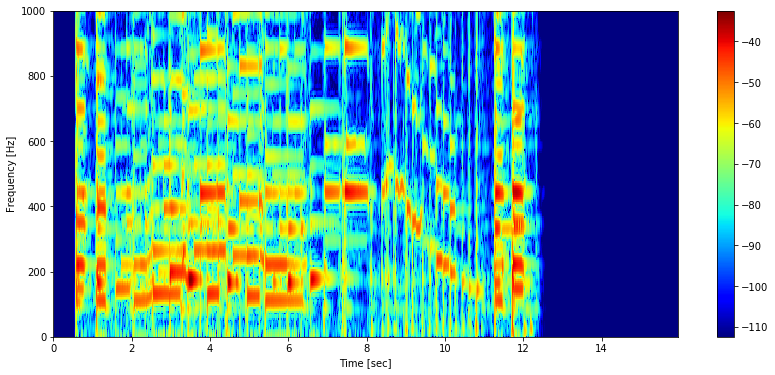

In [4]:
frameLength = np.int(np.round(0.05*samplingFreq)) # samples
hopSize = 0.5*frameLength # samples
nDft = 2**13
freqVector, timeVector, specgram = sig.spectrogram(guitarSignal, \
    fs=samplingFreq, window=np.hanning(frameLength), nperseg=frameLength, noverlap=hopSize, nfft=nDft)
maxDynamicRange = 80 # dB

plt.figure(figsize=(14,6))
plt.pcolormesh(timeVector, freqVector, 10*np.log10(limitDynamicRange(specgram, maxDynamicRange)), cmap='jet')
plt.xlabel('Time [sec]'), plt.ylabel('Frequency [Hz]')
plt.colorbar(), plt.xlim((0,timeVector[-1])), plt.ylim((0,1000));

In [5]:
filterCoef = 0.33
delay = np.int(np.round(0.159*samplingFreq)) # samples
feedBackIsUsed = True
guitarSignalWithEcho = combfiltering(guitarSignal, filterCoef, delay, feedBackIsUsed)
ipd.Audio(guitarSignalWithEcho, rate=samplingFreq)

### The tremelo effect
The tremelo effect is obtained by **modulating** the **amplitude** of the guitar signal, i.e.,
$$
    y_n = m_nx_n
$$
where $m_n$ is the non-negative **modulating signal** often given by
$$
    m_n = 1-A\cos\left(2\pi n\frac{f_\text{m}}{f_\text{s}}\right)
$$
with $0\leq A \leq 1$, the modulation frequency $f_\text{m}$ typically smaller than 20 Hz, and $f_\text{s}$ being the sampling frequency.


<center>
<img src="figures/ap8Tremelo.png" alt="Tremelo" width="80%"/>
</center>

In [6]:
def addTremelo(inputSignal, modulationAmp, modulationDigFreq):
    nData = np.size(inputSignal)
    samplingIndices = np.arange(nData)
    modulatingSignal = 1-modulationAmp*np.cos(modulationDigFreq*samplingIndices)
    return inputSignal*modulatingSignal

In [7]:
modulationDigFreq = 2*np.pi*330/samplingFreq # rad/sample
modulationAmp = 0.9
guitarSignalWithTremelo = addTremelo(guitarSignal, modulationAmp, modulationDigFreq)

ipd.Audio(guitarSignalWithTremelo, rate=samplingFreq)

### Summary
1. Guitarist often add different effects to the raw guitar signal
2. These effects are often also used in other applications such as movies, gaming, music, etc.
3. The **echo effect** is simply a comb filter with a long delay.
4. The **tremelo effect** is amplitude modulation.

### Active 5 minutes break
A first-order allpass filter has the difference equation
$$
    y_n = bx_n + x_{n-1} - by_{n-1}\ .
$$
1. Is the allpass filter a feedforward or a feedback filter?
2. Sketch the filter using summation, delay, and multiplication blocks.
3. What happens if $b > 1$?
3. Compute the DTFT of the left and right-hand sided of the difference equation. What is the frequency response $H(\omega)$ of the filter?

---
Tip: the DTFT of a delayed signal $x_{n-D}$ is given by
$$
    \sum_{n=-\infty}^{\infty} x_{n-D}\mathrm{e}^{-j\omega n} = \mathrm{e}^{-j\omega D} \sum_{n=-\infty}^{\infty} x_n\mathrm{e}^{-j\omega n} = \mathrm{e}^{-j\omega D} X(\omega)
$$

## Fractional delay filters
In the next 20 minutes, you will learn
- what an allpass filter is
- how an allpass filter can used to implement a non-integer delay

Some effects such as vibrato, chorus, and flanger require that we can implement a **fractional** (i.e., not an integer) delay.

A popular way of implementing a fractional delay is with a first-order **allpass filter** which is given by
$$
    y_n = bx_n + x_{n-1} - by_{n-1}\ .
$$

<center>
<img src="figures/ap8AllpassSketch.png" alt="Allpass filter" width="80%"/>
</center>

### Analysis of the allpass filter
To analyse the allpass filter, we first compute the Z-transform of it and obtain
\begin{align}
    Y(z) = \sum_{n=-\infty}^{\infty} y_{n}z^{-n} = b X(z) + z^{-1}X(z) - bz^{-1}Y(z)\ . 
\end{align}

If we now solve for $Y(z)$, we obtain
$$
    Y(z) = H(z)X(z)
$$
where the transfer function is
$$
    H(z) = \frac{b+z^{-1}}{1+bz^{-1}}\ .
$$

#### Poles and zeros
We can write the transfer function as a ratio of polynomials as
$$
    H(z) = \frac{b+z^{-1}}{1+bz^{-1}} = \frac{bz+1}{z+b}\ .
$$

Thus, we have that the
- **zeros** satisfy $bz+1=0$ which means that $z = -1/b$ is a zero
- **poles** satisfy $z+b=0$ which means that $z = -b$ is a pole

Example: if $b=0.5$, the pole is at $z=-0.5$ and the zero is at $z=-2$.

Plot of the pole (x) and the zero (o) of the allpass filter. The pole **must be inside the unit circle** for a **stable** filter. Thus, $-1<b<1$.
<center>
<img src="figures/ap8AllpassPzPlot.png" alt="Poles and zeros of the allpass filter" width="80%"/>
</center>

#### Frequency response of the allpass filter
If we evaluate the z-transform on the **unit circle**, i.e., set $z=\mathrm{e}^{j\omega}$, we obtain the **frequency response** to
$$
    H(\omega) = \frac{b+\mathrm{e}^{-j\omega}}{1+b\mathrm{e}^{-j\omega}}\ .
$$

Recall that $H(\omega)$ is just a complex number (which varies as a function of the frequency) so we can also write it in a polar form as
$$
    H(\omega) = |H(\omega)|\mathrm{e}^{j\angle H(\omega)}
$$
where
- **$|H(\omega)|$** is the **amplitude response**
- **$\angle H(\omega)$** is the **phase response**

For the allpass filter, these are given by
\begin{align}
    |H(\omega)| &= 1\\
    \angle H(\omega) &= -2\text{arctan}\left[\frac{1-b}{1+b}\tan(\omega/2)\right] \approx -\frac{1-b}{1+b}\omega
\end{align}
where the appoximation holds for low frequencies.

#### How does the phase response delay the signal?
Recall that sending a phasor $x_n = \mathrm{e}^{j\omega_0n}$ through a filter with frequency response $H(\omega)$ results in a filter output given by
$$
    y_n = H(\omega_0)\mathrm{e}^{j\omega_0n}\ .
$$

For the allpass filter where $|H(\omega_0)|=1$, we get that
\begin{align}
    y_n &= \mathrm{e}^{j\angle H(\omega_0)}\mathrm{e}^{j\omega_0n} = \mathrm{e}^{j\omega_0 n+j\angle H(\omega_0)}\\
    &= \mathrm{e}^{j\omega_0 (n-d)} = x_{n-d}\ .
\end{align}
where the delay $d$ is
$$
    d = -\frac{\angle H(\omega_0)}{\omega_0} \approx \frac{1-b}{1+b}\ .
$$

Thus, the filter output will be a delayed version of the phasor input, and the delay is $d$ samples.

Note the following:
- The filter is called an **allpass filter** since its amplitude response is 1.
- The approximate expression for the phase is valid when both $\omega$ and $\angle H(\omega)$ are small.
- The phase response controls the delay through the filter. If we want a delay of $d$ samples, we have to choose $b$ so that
$$
    d \approx \frac{1-b}{1+b}\ .
$$
If we solve this for $b$, we obtain
$$
    b \approx \frac{1-d}{1+d}\ .
$$

In [8]:
def allpassFiltering(inputSignal, fractionalDelay):
    apParameter = (1-fractionalDelay)/(1+fractionalDelay)
    nData = np.size(inputSignal)
    outputSignal = np.zeros(nData)
    for n in np.arange(nData):
        if n == 0:
            outputSignal[n] = apParameter*inputSignal[n]
        else:
            outputSignal[n] = apParameter*inputSignal[n]+inputSignal[n-1]-apParameter*outputSignal[n-1]
    return outputSignal

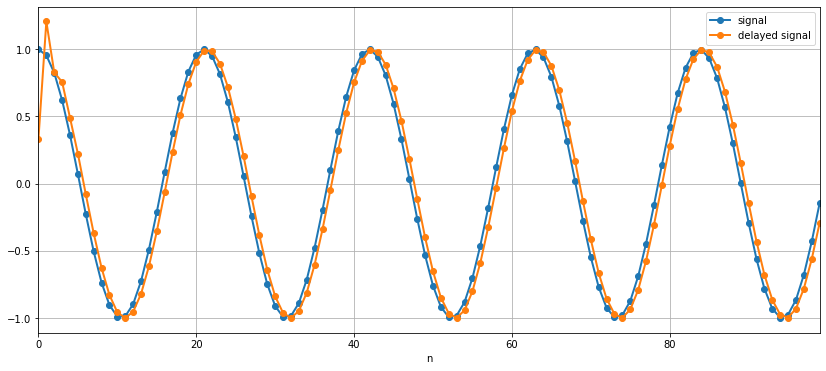

In [9]:
digFreq = 0.3 # rad/sample
nData = 100
samplingIndices = np.arange(nData)
signal = np.cos(digFreq*samplingIndices)
fractionalDelay = 0.5
delayedSignal = allpassFiltering(signal, fractionalDelay)

plt.figure(figsize=(14,6))
plt.plot(samplingIndices, signal, 'o-', linewidth=2, label='signal')
plt.plot(samplingIndices, delayedSignal, 'o-', linewidth=2, label='delayed signal')
plt.xlabel('n'), plt.xlim((samplingIndices[0],samplingIndices[-1])), plt.grid(True), plt.legend();

### Summary
1. An allpass filter can be used to make a fractional (i.e., non-integer) delay $d$
2. The allpass filter has one filter coefficient $b$ which is related to the $d$ via
$$
    b \approx \frac{1-d}{1+d}
$$
where the approximation holds for low frequencies.

## The vibrato effect
In the next 20 minutes, you will learn
- what the vibrato effect is
- how the allpass filter is used in the vibrato effect

The vibrato effect is obtained by making a time-varying delay of the guitar signal $x_n$, i.e., 
$$
    y_n = x_{n-D(n)}
$$
where $D(n)$ is the time-varying delay often given by
$$
    D(n) = \frac{D}{2}\left(1-\cos\left(2\pi n \frac{f_\text{m}}{f_\text{s}}\right)\right)
$$
with
- $D$ being the maximum delay in samples (typically smaller than 10 ms)
- $f_\text{m}$ the modulation frequency in Hz (typically 0.1 to 5 Hz)
- $f_\text{s}$ the sampling frequency in Hz

![Vibrato](./figures/ap8VibratoSketch.png)

In [1]:
def addVibrato(inputSignal, modDepth, digModFreq, offset=0):
    nData = np.size(inputSignal)
    outputSignal = np.zeros(nData)
    tmpSignal = np.zeros(nData)
    for n in np.arange(nData):
        # calculate delay
        delay = offset + (modDepth/2)*(1-np.cos(digModFreq*n))
        # calculate filter output
        if n < delay:
            outputSignal[n] = 0
        else:
            intDelay = np.int(np.floor(delay))
            tmpSignal[n] = inputSignal[n-intDelay]
            fractionalDelay = delay-intDelay
            apParameter = (1-fractionalDelay)/(1+fractionalDelay)
            outputSignal[n] = apParameter*tmpSignal[n]+tmpSignal[n-1]-apParameter*outputSignal[n-1]
    return outputSignal

In [7]:
maxDelay = 0.001*samplingFreq # samples
digModFreq = 2*np.pi*2/samplingFreq # rad/sample
guitarSignalWithVibrato = addVibrato(guitarSignal, maxDelay, digModFreq)
ipd.Audio(guitarSignalWithVibrato, rate=samplingFreq)

### Vibrato is frequency modulation
Frequency modulation (FM) is the way information is transported in FM radio.

![FM Radio](./figures/fmRadio.jpg)

Assume that we want to add the vibrato effect to a phasor input, i.e.,
$$
    x_n = \mathrm{e}^{j\omega_0 n}\\
$$

For a time-varying delay often given by
$$
    D(n) = \frac{D}{2}\left(1-\cos\left(2\pi n \frac{f_\text{m}}{f_\text{s}}\right)\right)\ ,
$$
the resulting signal is given by
$$
    y_n = x_{n-D(n)} = \mathrm{e}^{j\omega_0 (n-D(n))} = \mathrm{e}^{j\theta(n)}
$$
where
$$
    \theta(n) = \omega_0 n - \omega_0\frac{D}{2}\left(1-\cos\left(2\pi n \frac{f_\text{m}}{f_\text{s}}\right)\right)\ .
$$

Since the frequency of a phasor is defined as
$$
    \omega(n) = \frac{\partial \theta(n)}{\partial n}\ ,
$$
we get that the $y_n$ will be a phasor with a time-varying frequency of
$$
    \omega(n) = \omega_0\left(1-\frac{\pi Df_\text{m}}{f_\text{s}}\sin\left(2\pi n \frac{f_\text{m}}{f_\text{s}}\right)\right)\ .
$$
![Frequency Modulation](figures/ap8VibratoSketch.png)

The frequency modulation is 62.83 Hz.


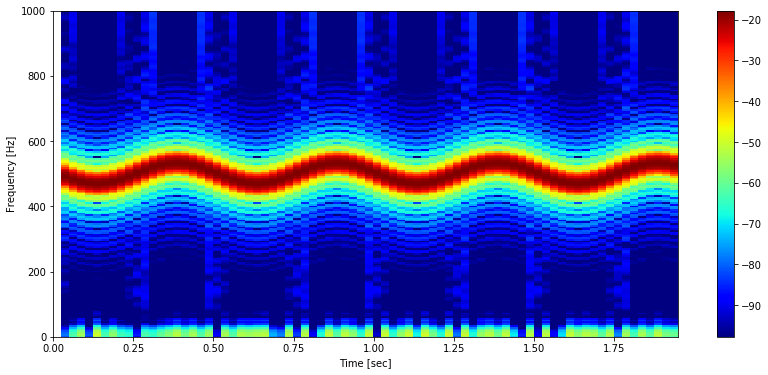

In [12]:
nData = 2*samplingFreq # samples
digFreq = 2*np.pi*500/samplingFreq # radians/sec
sinusoid = np.cos(digFreq*np.arange(nData))
maxDelay = 0.01*samplingFreq # samples
digModFreq = 2*np.pi*2/samplingFreq # rad/sample
sinusoidWithVibrato = addVibrato(sinusoid, maxDelay, digModFreq)
freqModulationAmp = maxDelay*digFreq*digModFreq*samplingFreq/(2*np.pi)
print('The frequency modulation is {0:.2f} Hz.'.format(freqModulationAmp))
freqVector, timeVector, specgram = sig.spectrogram(sinusoidWithVibrato, \
    fs=samplingFreq, window=np.hanning(frameLength), nperseg=frameLength, noverlap=hopSize, nfft=nDft)
plt.figure(figsize=(14,6))
plt.pcolormesh(timeVector, freqVector, 10*np.log10(limitDynamicRange(specgram, maxDynamicRange)), cmap='jet')
plt.xlabel('Time [sec]'), plt.ylabel('Frequency [Hz]'),plt.colorbar()
plt.xlim((0,timeVector[-1])), plt.ylim((0,1000));

#### Example: natural vibrato in audio signals

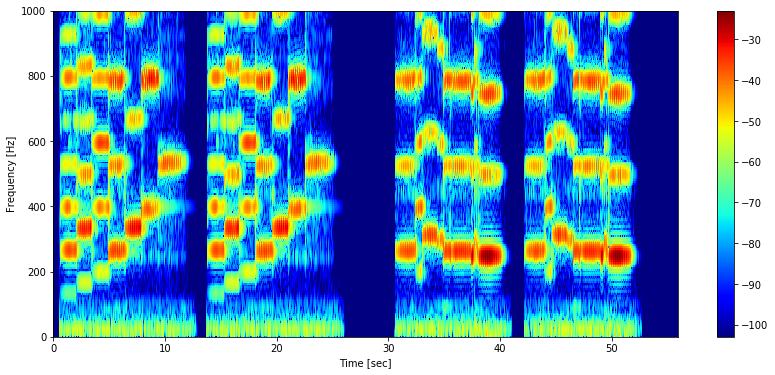

In [13]:
samplingFreq, violaSignal = wave.read('data/viola.wav')
violaSignal = violaSignal/2**15 # normalise
freqVector, timeVector, specgramViola = sig.spectrogram(violaSignal, \
    fs=samplingFreq, window=np.hanning(frameLength), nperseg=frameLength, noverlap=hopSize, nfft=nDft)
plt.figure(figsize=(14,6))
plt.pcolormesh(timeVector, freqVector, 10*np.log10(limitDynamicRange(specgramViola, maxDynamicRange)), cmap='jet')
plt.xlabel('Time [sec]'), plt.ylabel('Frequency [Hz]')
plt.colorbar(), plt.xlim((0,timeVector[-1])), plt.ylim((0,1000));
ipd.Audio(violaSignal, rate=samplingFreq)

### Summary
1. The vibrato effect is obtained by making a time-varying delay of a signal
2. The vibrato effect is the same as adding **frequency modulation** to all the phasors in a signal. The higher the frequency of the phasor, the stronger the modulation will be.

### Active 5 minutes break
Assume that we have an input signal consisting of the sum of two phasors, i.e.,
$$
    x_n = X(\omega_0) \mathrm{e}^{j\omega_0 n} + X(\omega_1) \mathrm{e}^{j\omega_1 n}\ .
$$
1. Apply the vibrato effect to this signal. That is, compute the signal
$$
    y_n = x_{n-D(n)}
$$
where $D(n)$ is a time-varying delay.
2. What is the significance of this result? For example, you could consider what would happen if the input signal consisted in a sum of $K$ phasors.

---
Tip: you have to use the rule 
$$
    a^na^m = a^{n+m}\ .
$$

## The chorus and flanger effects
In the next 20 minutes, you will learn
- what the chorus effect is
- what the flanger effect is

### The flanger effect
The flanger effect imitates the sound observed when a jet plane flies over the head of an observer. In this case, the observer will hear a mixture of two things
1. the direct sound from the jet plane
2. the reflection off the ground which is **time-varying** due to the jet plane's movement.

We can model this as
$$
    y_n = x_n + gx_{n-D(n)}
$$
where
- $g$ is a **mix** parameter
- $D(n)$ is a **time-varying delay** as in the vibrato effect

In the flanger effect, common choices for the **time-varying delay** are
1. triangular function
2. a sinusoidal function identical to what we used in the vibrato effect, i.e.,
$$
    D(n) = \frac{D}{2}\left(1-\cos\left(2\pi n \frac{f_\text{m}}{f_\text{s}}\right)\right)
$$
where the parameters have the same meaning as in the vibrato effect. A typical choice for the parameters in the flanger effect is
 - 0.1-1 Hz modulation frequency
 - 0-2 ms modulation depth

The flanger effect is also sometimes implemented as a **feedback filter** as
$$
    y_n = x_n + gy_{n-D(n)}
$$
where the mix parameter $g$ must have a magnitude smaller than 1 to ensure stability.

Note that
- it is a matter of taste whether one prefers the feedforward or feedback version of flanger
- the feedforward version of flanger is mathematically equivalent to the simplest chorus effect (we will cover this next)

In [14]:
def addSinusoidalFlanger(inputSignal, mixParam, digModFreq, modDepth, feedForwardIsUsed=True):
    if feedForwardIsUsed:
        outputSignal = inputSignal + \
            mixParam*addVibrato(inputSignal, modDepth, digModFreq)
    else:
        nData = np.size(inputSignal)
        outputSignal = np.zeros(nData)
        tmpSignal = np.zeros(nData)
        feedbackSignal = np.zeros(nData)
        for n in np.arange(nData):
            # calculate delay
            delay = (modDepth/2)*(1-np.cos(digModFreq*n))
            # calculate filter output
            if n < delay:
                outputSignal[n] = inputSignal[n]
            else:
                intDelay = np.int(np.floor(delay))
                tmpSignal[n] = outputSignal[n-intDelay]
                fractionalDelay = delay-intDelay
                apParameter = (1-fractionalDelay)/(1+fractionalDelay)
                feedbackSignal[n] = apParameter*tmpSignal[n]+tmpSignal[n-1]-apParameter*feedbackSignal[n-1]
                outputSignal[n] = inputSignal[n] + mixParam*feedbackSignal[n]
    return outputSignal

In [15]:
mixParam = 0.5
digModFreq = 2*np.pi*0.5/samplingFreq # radians/sample
modDepth = 0.002*samplingFreq # samples
feedForwardIsUsed = False
guitarSignalWithFlanger = addSinusoidalFlanger(guitarSignal, mixParam, digModFreq, modDepth, feedForwardIsUsed)
ipd.Audio(guitarSignalWithFlanger, rate=samplingFreq)

### The chorus effect
Based on the recording from just **one instrument** (e.g., a violin), the chorus effect imitates that multiple, identical instruments are playing together (e.g., 10 violins). 

<br />
<center>
<img src="figures/violins.jpg" alt="Violins" width="80%"/>
</center>

#### Two instruments from one
Assume that we have one instrument recording $x_n$. From this, we can imitate that two instruments are playing together by computing
$$
    y_n = x_n + gx_{n-D(n)}
$$
where
- $g$ is a **mix** parameter
- $D(n)$ is a **time-varying delay** as in the vibrato effect

Note that this special case of the chorus effect is mathematically equivalent to the flanger effect.

In the chorus effect, common choices for the **time-varying delay** are
1. lowpass filtered random noise
2. a sinusoidal function similar to what we used in the vibrato effect, i.e.,
$$
    D(n) = F + \frac{D}{2}\left(1-\cos\left(2\pi n \frac{f_\text{m}}{f_\text{s}}\right)\right)
$$
where $F$ is a **delay offset** in samples and the remaining parameters are the same as in the vibrato effect. A typical choice for the parameters in the chorus effect is
 - 10 ms offset
 - 0.2 Hz modulation frequency
 - 20 ms modulation depth

#### Many instruments from one
Assume that we have one instrument recording $x_n$. From this, we can imitate $K$ instruments are playing together by computing
\begin{align}
    y_n &= x_n + g_1x_{n-D_1(n)} + \cdots + g_Kx_{n-D_K(n)}\\
    &= x_n + \sum_{k=1}^K g_kx_{n-D_k(n)}
\end{align}
where
- $g_k$ is a **mix** parameter of the $k$'th simulated instrument
- $D_k(n)$ is a **time-varying delay** of the $k$'th simulated instrument.

In [16]:
def addSinusoidalChorus(inputSignal, mixParam, offset, digModFreq, modDepth):
    # add the original instrument to the mix
    outputSignal = inputSignal
    # add additional instruments using the vibrato effect
    nAdditionInstruments = np.size(mixParam)
    for ii in np.arange(nAdditionInstruments):
        outputSignal = outputSignal + \
            mixParam[ii]*addVibrato(inputSignal, modDepth[ii], digModFreq[ii], offset[ii])
    return outputSignal

In [17]:
mixParam = np.array([0.9, 0.9, 0.8])
offset = np.array([0.01, 0.012, 0.008])*samplingFreq # samples
digModFreq = 2*np.pi*np.array([0.1, 0.15, 0.05])/samplingFreq # radians/sample
modDepth = np.array([0.02, 0.021, 0.018])*samplingFreq # samples
guitarSignalWithChorus = addSinusoidalChorus(guitarSignal, mixParam, offset, digModFreq, modDepth)
ipd.Audio(guitarSignalWithChorus, rate=samplingFreq)

### Summary
1. The flanger effect imitates the sound from a jet plane moving relative to an observer
2. The chorus effect imitates the sound of multiple, identical instruments playing together
3. Both the flanger and chorus effects make use of a time-varying delay.